View 1: Photometric MSE (Wrap Fisheye vs Real Fisheye): 0.18px |Photometric Mean (Total): 4.55px | Geometric Mean (Total): 0.00px


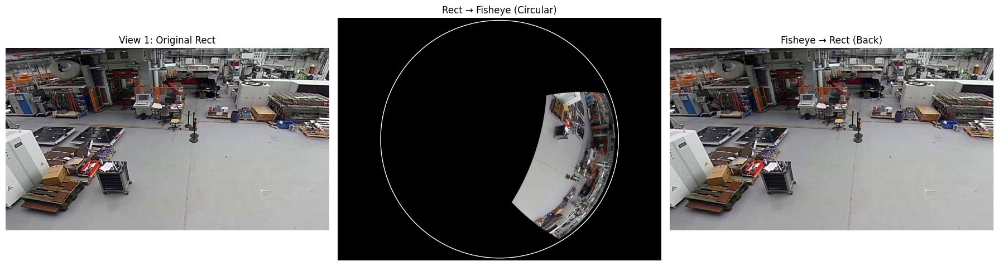

View 2: Photometric MSE (Wrap Fisheye vs Real Fisheye): 0.16px |Photometric Mean (Total): 3.55px | Geometric Mean (Total): 0.00px


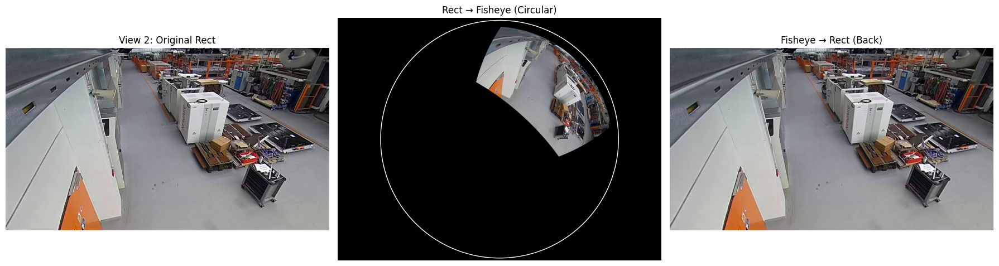

View 3: Photometric MSE (Wrap Fisheye vs Real Fisheye): 0.16px |Photometric Mean (Total): 2.22px | Geometric Mean (Total): 0.00px


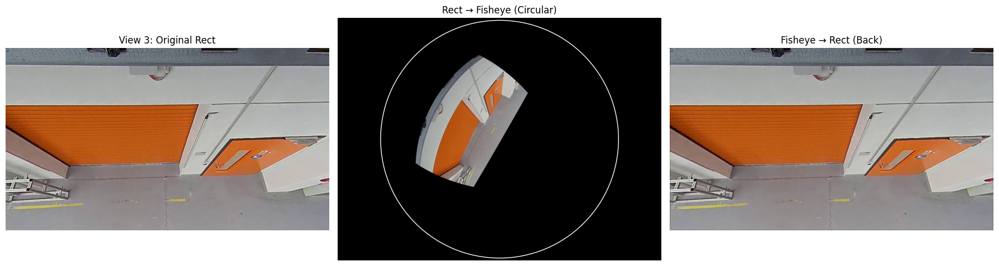

View 4: Photometric MSE (Wrap Fisheye vs Real Fisheye): 0.16px |Photometric Mean (Total): 3.36px | Geometric Mean (Total): 0.00px


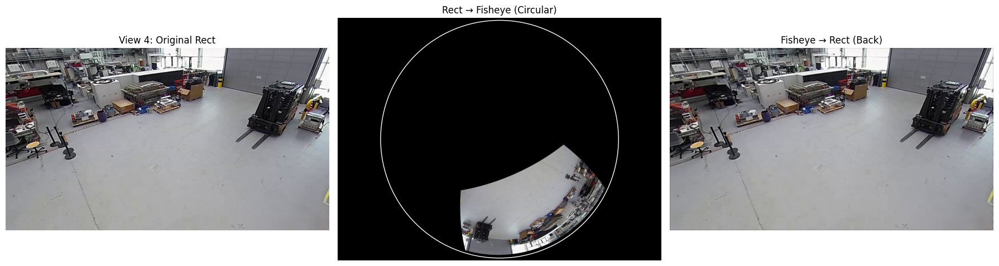

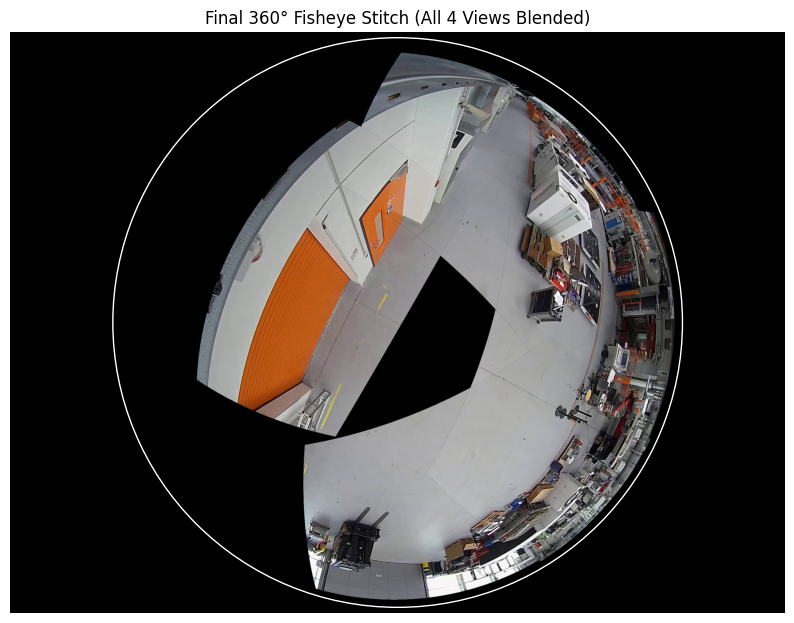

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# =====================================================
# FISHEYE PARAMETERS (geometry-accurate)
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# =====================================================
# CAMERA SETTINGS
# =====================================================
cam_settings = [
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": -18.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 54.0, "yaw": 48.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 28.0, "yaw": 150.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": 294.0},
]

# =====================================================
# LOAD IMAGES
# =====================================================
views = [
    cv2.imread("captures_yaw_pitch/capture1/view1_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view2_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view3_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view4_1.jpg"),
]
fisheye_img = cv2.imread("captures_yaw_pitch/capture1/fisheye_1.jpg")

if fisheye_img is None or any(v is None for v in views):
    raise FileNotFoundError("❌ Missing fisheye or rect images!")

fisheye_img = cv2.cvtColor(fisheye_img, cv2.COLOR_BGR2RGB) / 255.0
views = [cv2.cvtColor(v, cv2.COLOR_BGR2RGB) / 255.0 for v in views]

# =====================================================
# CAMERA BASIS
# =====================================================
def compute_basis(yaw_deg, pitch_deg):
    """Compute camera orientation basis from yaw/pitch in degrees."""
    yaw, pitch = np.deg2rad([yaw_deg, pitch_deg])
    D = np.array([0, 0, 1])
    H = np.array([np.cos(yaw), np.sin(yaw), 0])
    Fv = np.cos(pitch) * D + np.sin(pitch) * H
    Fv /= np.linalg.norm(Fv)
    Rv = np.cross(Fv, D); Rv /= np.linalg.norm(Rv)
    Uv = np.cross(Rv, Fv)
    return Fv, Rv, Uv


def project_rect_to_fisheye(rect_img, view, fish):
    """Warp rectilinear image to fisheye image space."""
    Hr, Wr = 720,1280
    Hf, Wf = fish["height"], fish["width"]
    cx_f, cy_f = fish["cx"], fish["cy"]
    radius, theta_max = fish["radius"], fish["theta_max_rad"]
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(view["fov"] / 2))
    Fv, Rv, Uv = compute_basis(view["yaw"], view["pitch"])

    # fisheye pixel grid
    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, cy_f - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)

    # fisheye rays (global coordinates)
    ray = np.dstack([np.sin(theta) * np.cos(phi),
                     np.sin(theta) * np.sin(phi),
                     np.cos(theta)])

    # rotate rays to rect camera coordinates
    R = np.stack([Rv, Uv, Fv], axis=1)
    ray_rect = ray @ R
    Xc, Yc, Zc = ray_rect[..., 0], ray_rect[..., 1], ray_rect[..., 2]

    # perspective projection
    u = f * (Xc / (Zc + 1e-6)) + cx_r
    v = f * (Yc / (Zc + 1e-6)) + cy_r
    valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)

    warped = cv2.remap(rect_img, u.astype(np.float32), v.astype(np.float32),
                       cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    mask = np.zeros((Hf, Wf), np.uint8); mask[valid] = 1
    return warped, mask


def fisheye_to_rect_inverse(fish_img, view, fish):
    """Unwarp fisheye image into rectilinear view."""
    Hr, Wr = 720, 1280
    Hf, Wf = fish["height"], fish["width"]
    cx_f, cy_f = fish["cx"], fish["cy"]
    radius, theta_max = fish["radius"], fish["theta_max_rad"]
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(view["fov"] / 2))
    Fv, Rv, Uv = compute_basis(view["yaw"], view["pitch"])

    # rectilinear pixel grid
    xs, ys = np.meshgrid(np.arange(Wr), np.arange(Hr))
    ray = np.stack([(xs - cx_r) / f, (ys - cy_r) / f, np.ones_like(xs)], axis=-1)
    ray /= np.linalg.norm(ray, axis=2, keepdims=True)

    # rotate to fisheye/global coordinates
    R = np.stack([Rv, Uv, Fv], axis=1)
    ray_fish = ray @ R.T
    Xf, Yf, Zf = ray_fish[..., 0], ray_fish[..., 1], ray_fish[..., 2]

    # project onto fisheye image
    theta = np.arccos(np.clip(Zf, -1, 1))
    phi = np.arctan2(Yf, Xf)
    r = (theta / theta_max) * radius
    u = cx_f + r * np.cos(phi)
    v = cy_f - r * np.sin(phi)
    valid = (u >= 0) & (u < Wf) & (v >= 0) & (v < Hf)

    rectified = cv2.remap(fish_img, u.astype(np.float32), v.astype(np.float32),
                          cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    mask = np.zeros((Hr, Wr), np.uint8); mask[valid] = 1
    return rectified, mask

# =====================================================
# GEOMETRIC DISPLACEMENT
# =====================================================
def geometric_displacement(rect_img, params, fisheye_params, step=40):
    Hr, Wr = rect_img.shape[:2]
    ys, xs = np.mgrid[0:Hr:step, 0:Wr:step]
    coords = np.stack([xs.ravel(), ys.ravel()], axis=-1)

    f = (Wr / 2) / np.tan(np.deg2rad(params["fov"] / 2))
    cx_r, cy_r = params["cx"], params["cy"]
    Fv, Rv, Uv = compute_basis(params["yaw"], params["pitch"])

    x = (coords[:, 0] - cx_r) / f
    y = (coords[:, 1] - cy_r) / f
    z = np.ones_like(x)
    ray = np.stack([x, y, z], axis=1)
    ray /= np.linalg.norm(ray, axis=1, keepdims=True)

    Xf = ray @ np.array([Rv[0], Uv[0], Fv[0]])
    Yf = ray @ np.array([Rv[1], Uv[1], Fv[1]])
    Zf = ray @ np.array([Rv[2], Uv[2], Fv[2]])

    theta_max = fisheye_params["theta_max_rad"]
    radius = fisheye_params["radius"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]

    theta = np.arccos(np.clip(Zf, -1, 1))
    phi = np.arctan2(Yf, Xf)
    sin_t = np.sin(theta)
    ray_fish = np.stack([sin_t * np.cos(phi), sin_t * np.sin(phi), np.cos(theta)], axis=1)
    Rmat = np.stack([Rv, Uv, Fv], axis=1)
    ray_rect = (Rmat.T @ ray_fish.T).T
    Xc, Yc, Zc = ray_rect[:, 0], ray_rect[:, 1], ray_rect[:, 2]
    u_back = f * (Xc / Zc) + cx_r
    v_back = f * (Yc / Zc) + cy_r
    valid = (Zc > 0) & (u_back >= 0) & (u_back < Wr) & (v_back >= 0) & (v_back < Hr)
    disp = np.sqrt((coords[:, 0] - u_back)**2 + (coords[:, 1] - v_back)**2)
    mean_disp = np.mean(disp[valid])
    rms_disp = np.sqrt(np.mean(disp[valid]**2))
    return coords[valid], u_back[valid], v_back[valid], disp[valid], mean_disp, rms_disp

# =====================================================
# MAIN ROUND TRIP + GEOMETRIC ERROR 
# =====================================================
Hf, Wf = fisheye_params["height"], fisheye_params["width"]
cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
radius = fisheye_params["radius"]

fisheye_canvas = np.zeros((Hf, Wf, 3), dtype=np.float32)
weight_mask = np.zeros((Hf, Wf, 1), dtype=np.float32)

for i, params in enumerate(cam_settings):
    rect_img = cv2.resize(views[i], (1280, 720))
    warped, mask = project_rect_to_fisheye(rect_img, params, fisheye_params)
    rect_back, mask_inv = fisheye_to_rect_inverse(warped, params, fisheye_params)

    yy, xx = np.mgrid[0:warped.shape[0], 0:warped.shape[1]]
    circle_mask = ((xx - cx_f)**2 + (yy - cy_f)**2) <= radius**2
    warped_circle = warped.copy()
    warped_circle[~circle_mask] = 0

    diff = np.linalg.norm((rect_img - rect_back), axis=2)
    valid_mask = mask_inv > 0
    diff_valid = diff[valid_mask]
    mean_disp = np.mean(diff_valid)*255 if diff_valid.size>0 else 0
    rms_disp = np.sqrt(np.mean(diff_valid**2))*255 if diff_valid.size>0 else 0

    # Ensure both are same size and normalized
    real_fish = cv2.resize(fisheye_img, (Wf, Hf))
    stitched_fish = np.clip(warped, 0, 1)

    # Compute photometric MSE (in fisheye domain)
    diff_fish = (real_fish - stitched_fish)
    mse_fish = np.mean(diff_fish**2)
    rmse_fish = np.sqrt(mse_fish)

    coords, u_back, v_back, disp, mean_geo, rms_geo = geometric_displacement(rect_img, params, fisheye_params)


    print(f"View {i+1}: Photometric MSE (Wrap Fisheye vs Real Fisheye): {mse_fish:.2f}px |Photometric Mean (Total): {mean_disp:.2f}px | Geometric Mean (Total): {mean_geo:.2f}px")

    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1); plt.imshow(rect_img); plt.title(f"View {i+1}: Original Rect"); plt.axis("off")
    plt.subplot(1, 3, 2); plt.imshow(warped_circle); 
    circ = plt.Circle((fisheye_params["cx"], fisheye_params["cy"]),
                    fisheye_params["radius"], color=(1,1,1), fill=False, linewidth=1)
    plt.gca().add_patch(circ)
    plt.title("Rect → Fisheye (Circular)"); plt.axis("off")
    plt.subplot(1, 3, 3); plt.imshow(rect_back); plt.title("Fisheye → Rect (Back)"); plt.axis("off")
    # plt.subplot(1, 4, 4)
    # err_vis = np.zeros_like(rect_img)
    # err_vis[..., :] = diff[..., None]*valid_mask[..., None]
    # plt.imshow(err_vis * 255 / np.max(err_vis)); plt.title(f"Error Map | RMS={rms_disp:.2f}px"); plt.axis("off")
    plt.tight_layout(); plt.show()
    
    # accumulate for stitched fisheye
    mask3 = mask[..., None].astype(np.float32)
    fisheye_canvas += warped * mask3
    weight_mask += mask3

# Final fisheye blend
weight_mask[weight_mask == 0] = 1
fisheye_stitched = fisheye_canvas / weight_mask
yy, xx = np.mgrid[0:Hf, 0:Wf]
circle_mask = ((xx - cx_f)**2 + (yy - cy_f)**2) <= radius**2
fisheye_stitched[~circle_mask] = 0

plt.figure(figsize=(10,10))
plt.imshow(fisheye_stitched)
circ = plt.Circle((fisheye_params["cx"], fisheye_params["cy"]),
                    fisheye_params["radius"], color=(1,1,1), fill=False, linewidth=1)
plt.gca().add_patch(circ)
plt.title("Final 360° Fisheye Stitch (All 4 Views Blended)")
plt.axis("off"); plt.show()



View 1:
  Photometric MSE (Fisheye): 0.145502
  Photometric Mean (Rect round-trip): 2.611px
  Geometric Error (Fisheye-domain): 0.412350
  Geometric Error (Rect-domain round-trip): 0.017835


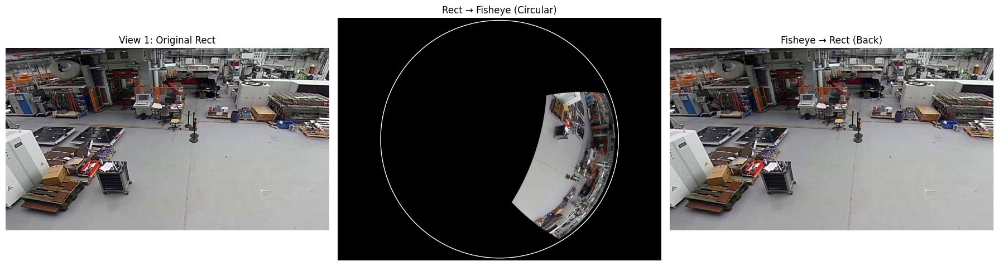


View 2:
  Photometric MSE (Fisheye): 0.144034
  Photometric Mean (Rect round-trip): 2.031px
  Geometric Error (Fisheye-domain): 0.422647
  Geometric Error (Rect-domain round-trip): 0.013905


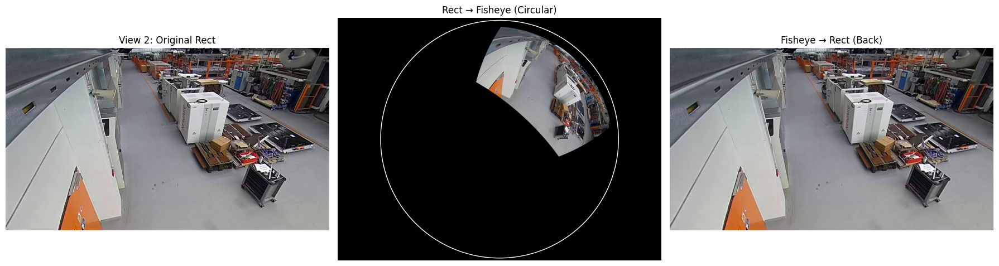


View 3:
  Photometric MSE (Fisheye): 0.141839
  Photometric Mean (Rect round-trip): 1.265px
  Geometric Error (Fisheye-domain): 0.496958
  Geometric Error (Rect-domain round-trip): 0.008724


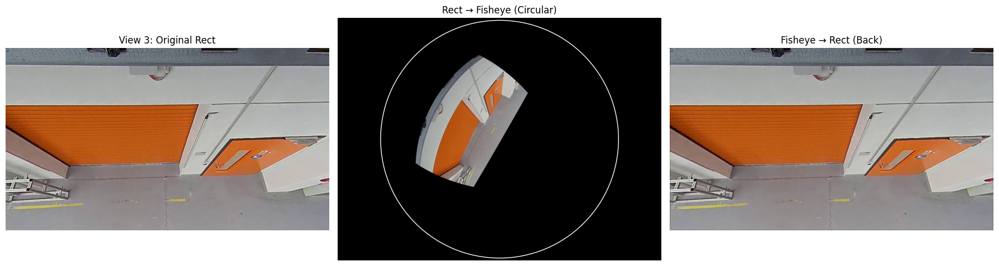


View 4:
  Photometric MSE (Fisheye): 0.133170
  Photometric Mean (Rect round-trip): 1.931px
  Geometric Error (Fisheye-domain): 0.438627
  Geometric Error (Rect-domain round-trip): 0.013188


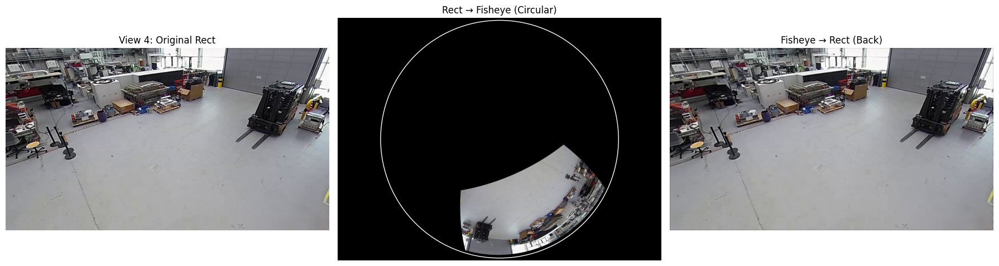

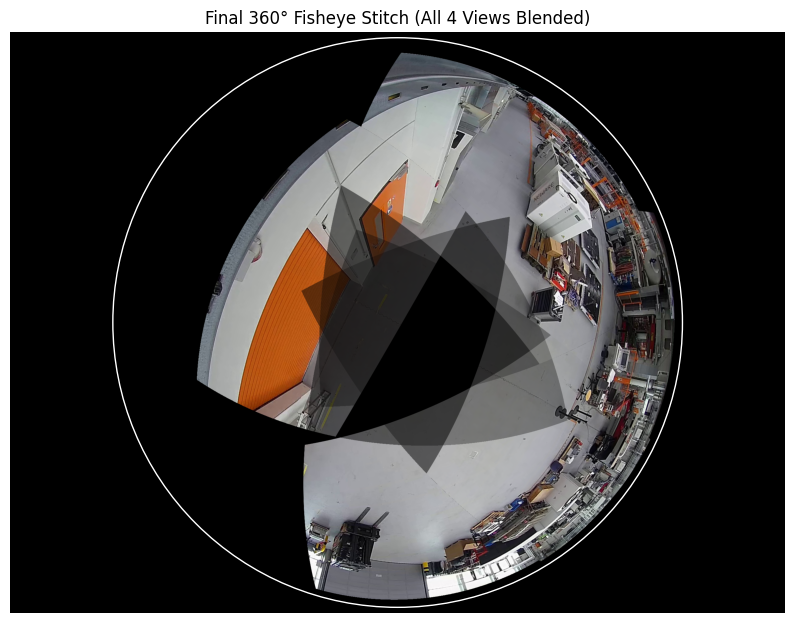

In [5]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# =====================================================
# FISHEYE PARAMETERS
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# =====================================================
# CAMERA SETTINGS
# =====================================================
cam_settings = [
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": -18.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 54.0, "yaw": 48.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 28.0, "yaw": 150.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": 294.0},
]

# =====================================================
# LOAD IMAGES
# =====================================================
views = [
    cv2.imread("captures_yaw_pitch/capture1/view1_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view2_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view3_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view4_1.jpg"),
]
fisheye_img = cv2.imread("captures_yaw_pitch/capture1/fisheye_1.jpg")

if fisheye_img is None or any(v is None for v in views):
    raise FileNotFoundError("❌ Missing fisheye or rect images!")

fisheye_img = cv2.cvtColor(fisheye_img, cv2.COLOR_BGR2RGB) / 255.0
views = [cv2.cvtColor(v, cv2.COLOR_BGR2RGB) / 255.0 for v in views]

# =====================================================
# CAMERA BASIS
# =====================================================
def compute_basis(yaw_deg, pitch_deg):
    yaw, pitch = np.deg2rad([yaw_deg, pitch_deg])
    D = np.array([0, 0, 1])
    H = np.array([np.cos(yaw), np.sin(yaw), 0])
    Fv = np.cos(pitch) * D + np.sin(pitch) * H
    Fv /= np.linalg.norm(Fv)
    Rv = np.cross(Fv, D); Rv /= np.linalg.norm(Rv)
    Uv = np.cross(Rv, Fv)
    return Fv, Rv, Uv

# =====================================================
# Rect → Fisheye warp
# =====================================================
def project_rect_to_fisheye(rect_img, view, fish):
    Hr, Wr = 720, 1280
    Hf, Wf = fish["height"], fish["width"]
    cx_f, cy_f = fish["cx"], fish["cy"]
    radius, theta_max = fish["radius"], fish["theta_max_rad"]
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(view["fov"] / 2))
    Fv, Rv, Uv = compute_basis(view["yaw"], view["pitch"])

    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, cy_f - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)

    ray = np.dstack([
        np.sin(theta) * np.cos(phi),
        np.sin(theta) * np.sin(phi),
        np.cos(theta)
    ])

    R = np.stack([Rv, Uv, Fv], axis=1)
    ray_rect = ray @ R
    Xc, Yc, Zc = ray_rect[..., 0], ray_rect[..., 1], ray_rect[..., 2]

    u = f * (Xc / (Zc + 1e-6)) + cx_r
    v = f * (Yc / (Zc + 1e-6)) + cy_r
    valid = (u >= 0) & (u < Wr) & (v >= 0) & (r <= radius) & (Zc > 0)

    warped = cv2.remap(rect_img, u.astype(np.float32), v.astype(np.float32),
                       cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    mask = np.zeros((Hf, Wf), np.uint8)
    mask[valid] = 1
    return warped, mask

# =====================================================
# Fisheye → Rect inverse
# =====================================================
def fisheye_to_rect_inverse(fish_img, view, fish):
    Hr, Wr = 720, 1280
    Hf, Wf = fish["height"], fish["width"]
    cx_f, cy_f = fish["cx"], fish["cy"]
    radius, theta_max = fish["radius"], fish["theta_max_rad"]
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(view["fov"] / 2))
    Fv, Rv, Uv = compute_basis(view["yaw"], view["pitch"])

    xs, ys = np.meshgrid(np.arange(Wr), np.arange(Hr))
    ray = np.stack([(xs - cx_r) / f, (ys - cy_r) / f, np.ones_like(xs)], axis=-1)
    ray /= np.linalg.norm(ray, axis=2, keepdims=True)

    R = np.stack([Rv, Uv, Fv], axis=1)
    ray_fish = ray @ R.T
    Xf, Yf, Zf = ray_fish[..., 0], ray_fish[..., 1], ray_fish[..., 2]

    theta = np.arccos(np.clip(Zf, -1, 1))
    phi = np.arctan2(Yf, Xf)
    r = (theta / theta_max) * radius
    u = cx_f + r * np.cos(phi)
    v = cy_f - r * np.sin(phi)
    valid = (u >= 0) & (u < Wf) & (v >= 0) & (v < Hf)

    rectified = cv2.remap(fish_img, u.astype(np.float32), v.astype(np.float32),
                          cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    mask = np.zeros((Hr, Wr), np.uint8)
    mask[valid] = 1
    return rectified, mask

# =====================================================
# MAIN ROUND TRIP + GEOMETRIC ERROR (Euclidean Form)
# =====================================================
Hf, Wf = fisheye_params["height"], fisheye_params["width"]
cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
radius = fisheye_params["radius"]


fisheye_canvas = np.zeros((Hf, Wf, 3), dtype=np.float32)
weight_mask = np.zeros((Hf, Wf, 1), dtype=np.float32)

for i, params in enumerate(cam_settings):
    rect_img = cv2.resize(views[i], (1280, 720))
    warped, mask = project_rect_to_fisheye(rect_img, params, fisheye_params)
    rect_back, mask_inv = fisheye_to_rect_inverse(warped, params, fisheye_params)

    # Mask fisheye circle
    yy, xx = np.mgrid[0:warped.shape[0], 0:warped.shape[1]]
    circle_mask = ((xx - cx_f)**2 + (yy - cy_f)**2) <= radius**2
    warped_circle = warped.copy()
    warped_circle[~circle_mask] = 0

    # -------------------------------------------------
    # ✅ Photometric Error
    # -------------------------------------------------
    diff_photo = np.abs(cv2.resize(fisheye_img, (Wf, Hf)) - warped_circle)
    mse_fish = np.mean(diff_photo**2)
    diff_rect = np.abs(rect_img - rect_back)
    mean_photo_rect = np.mean(diff_rect[mask_inv > 0]) * 255

    # -------------------------------------------------
    # ✅ Geometric Error (Fisheye-domain)
    # -------------------------------------------------
    yy_valid, xx_valid = np.where(mask > 0)
    real_fish = cv2.resize(fisheye_img, (Wf, Hf))
    geo_error_fish = np.sqrt(
        (warped_circle[yy_valid, xx_valid, 0] - real_fish[yy_valid, xx_valid, 0])**2 +
        (warped_circle[yy_valid, xx_valid, 1] - real_fish[yy_valid, xx_valid, 1])**2 +
        (warped_circle[yy_valid, xx_valid, 2] - real_fish[yy_valid, xx_valid, 2])**2
    )
    mean_geo_error_fish = np.mean(geo_error_fish)

    # -------------------------------------------------
    # ✅ Geometric Error (Rect-domain round-trip)
    # -------------------------------------------------
    ys_valid, xs_valid = np.where(mask_inv > 0)
    geo_error_rect = np.sqrt(
        (rect_img[ys_valid, xs_valid, 0] - rect_back[ys_valid, xs_valid, 0])**2 +
        (rect_img[ys_valid, xs_valid, 1] - rect_back[ys_valid, xs_valid, 1])**2 +
        (rect_img[ys_valid, xs_valid, 2] - rect_back[ys_valid, xs_valid, 2])**2
    )
    mean_geo_error_rect = np.mean(geo_error_rect)

    # -------------------------------------------------
    # ✅ Print Summary
    # -------------------------------------------------
    print(f"\nView {i+1}:")
    print(f"  Photometric MSE (Fisheye): {mse_fish:.6f}")
    print(f"  Photometric Mean (Rect round-trip): {mean_photo_rect:.3f}px")
    print(f"  Geometric Error (Fisheye-domain): {mean_geo_error_fish:.6f}")
    print(f"  Geometric Error (Rect-domain round-trip): {mean_geo_error_rect:.6f}")

    # -------------------------------------------------
    # Visualization
    # -------------------------------------------------
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1); plt.imshow(rect_img); plt.title(f"View {i+1}: Original Rect"); plt.axis("off")
    plt.subplot(1, 3, 2); plt.imshow(warped_circle)
    circ = plt.Circle((cx_f, cy_f), radius, color=(1,1,1), fill=False, linewidth=1)
    plt.gca().add_patch(circ); plt.title("Rect → Fisheye (Circular)"); plt.axis("off")
    plt.subplot(1, 3, 3); plt.imshow(rect_back); plt.title("Fisheye → Rect (Back)"); plt.axis("off")
    plt.tight_layout(); plt.show()
     # accumulate for stitched fisheye
    mask3 = mask[..., None].astype(np.float32)
    fisheye_canvas += warped * mask3
    weight_mask += mask3

# Final fisheye blend
weight_mask[weight_mask == 0] = 1
fisheye_stitched = fisheye_canvas / weight_mask
yy, xx = np.mgrid[0:Hf, 0:Wf]
circle_mask = ((xx - cx_f)**2 + (yy - cy_f)**2) <= radius**2
fisheye_stitched[~circle_mask] = 0

plt.figure(figsize=(10,10))
plt.imshow(fisheye_stitched)
circ = plt.Circle((fisheye_params["cx"], fisheye_params["cy"]),
                    fisheye_params["radius"], color=(1,1,1), fill=False, linewidth=1)
plt.gca().add_patch(circ)
plt.title("Final 360° Fisheye Stitch (All 4 Views Blended)")
plt.axis("off"); plt.show()


det(R): -1.0
det(R): -1.0

View 1:
  Photometric MSE (Fisheye): 0.167413
  Photometric Mean (Rect round-trip): 2.885px
  Geometric Error (Fisheye-domain): 0.552836
  Geometric Error (Rect-domain round-trip): 0.019700


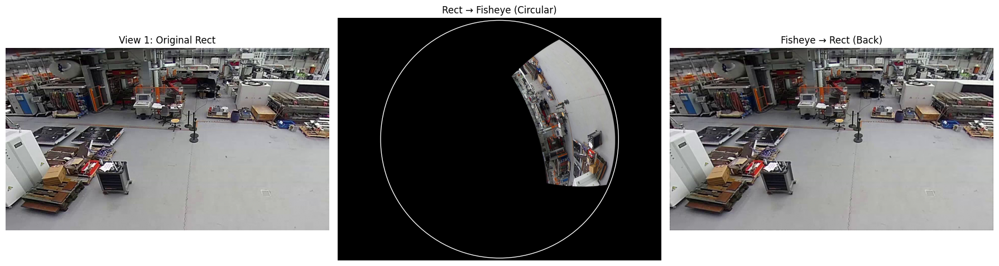

det(R): -1.0
det(R): -1.0

View 2:
  Photometric MSE (Fisheye): 0.148370
  Photometric Mean (Rect round-trip): 2.197px
  Geometric Error (Fisheye-domain): 0.453022
  Geometric Error (Rect-domain round-trip): 0.015029


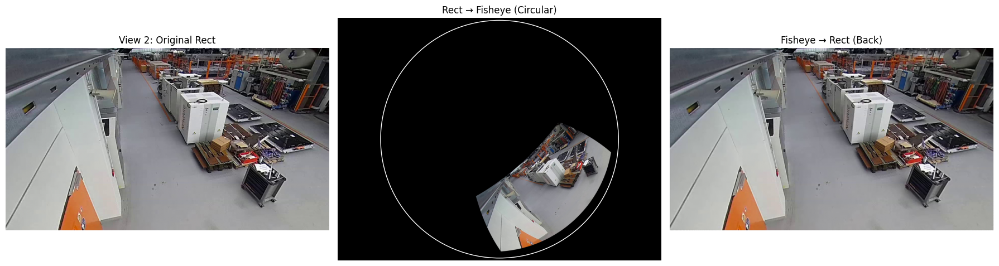

det(R): -1.0000000000000002
det(R): -1.0000000000000002

View 3:
  Photometric MSE (Fisheye): 0.146322
  Photometric Mean (Rect round-trip): 1.330px
  Geometric Error (Fisheye-domain): 0.312825
  Geometric Error (Rect-domain round-trip): 0.009168


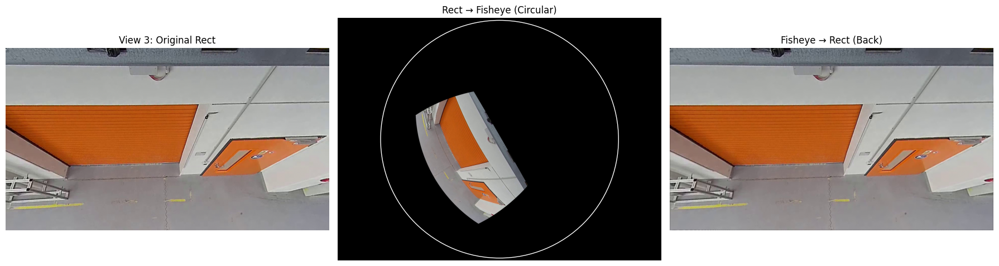

det(R): -1.0
det(R): -1.0

View 4:
  Photometric MSE (Fisheye): 0.156877
  Photometric Mean (Rect round-trip): 2.199px
  Geometric Error (Fisheye-domain): 0.452936
  Geometric Error (Rect-domain round-trip): 0.015010


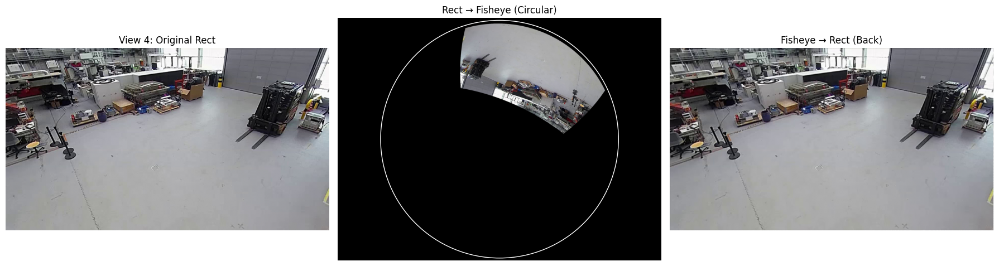

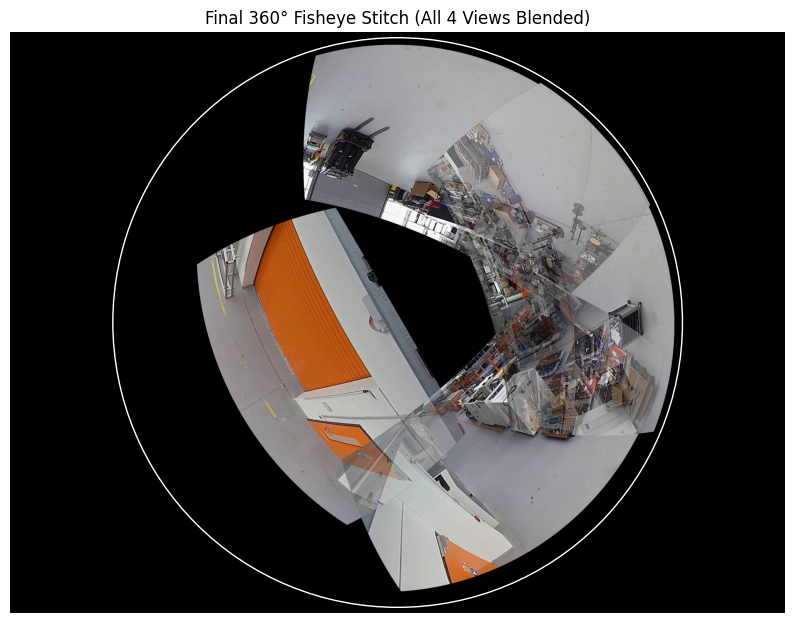

In [50]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# =====================================================
# FISHEYE PARAMETERS (geometry-accurate)
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# =====================================================
# CAMERA SETTINGS
# =====================================================
cam_settings = [
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": -18.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 54.0, "yaw": 48.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 28.0, "yaw": 150.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": 294.0},
]

# =====================================================
# LOAD IMAGES
# =====================================================
views = [
    cv2.imread("captures_yaw_pitch/capture1/view1_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view2_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view3_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view4_1.jpg"),
]
fisheye_img = cv2.imread("captures_yaw_pitch/capture1/fisheye_1.jpg")

if fisheye_img is None or any(v is None for v in views):
    raise FileNotFoundError("❌ Missing fisheye or rect images!")

fisheye_img = cv2.cvtColor(fisheye_img, cv2.COLOR_BGR2RGB) / 255.0
views = [cv2.cvtColor(v, cv2.COLOR_BGR2RGB) / 255.0 for v in views]

# =====================================================
# CAMERA BASIS
# =====================================================
def compute_basis(yaw_deg, pitch_deg):
    """Compute camera orientation basis from yaw/pitch in degrees."""
    yaw, pitch = np.deg2rad([yaw_deg, pitch_deg])
    D = np.array([0, 0, 1])
    H = np.array([np.cos(yaw), np.sin(yaw), 0])
    Fv = np.cos(pitch) * D + np.sin(pitch) * H
    Fv /= np.linalg.norm(Fv)
    Rv = np.cross(Fv, D); Rv /= np.linalg.norm(Rv)
    Uv = np.cross(Rv, Fv)
    return Fv, Rv, Uv


def project_rect_to_fisheye(rect_img, view, fish):
    """Warp rectilinear image to fisheye image space."""
    Hr, Wr = 720,1280
    Hf, Wf = fish["height"], fish["width"]
    cx_f, cy_f = fish["cx"], fish["cy"]
    radius, theta_max = fish["radius"], fish["theta_max_rad"]
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(view["fov"] / 2))
    Fv, Rv, Uv = compute_basis(view["yaw"], view["pitch"])

    # fisheye pixel grid
    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, cy_f - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    # fisheye rays (global coordinates)
    ray = np.dstack([sin_t * np.cos(phi),
                     sin_t * np.sin(phi),
                     np.cos(theta)])

    # rotate rays to rect camera coordinates
    R = np.stack([Rv, Uv, Fv], axis=1)
    ray_rect = ray @ R
    Xc, Yc, Zc = ray_rect[..., 0], ray_rect[..., 1], ray_rect[..., 2]

    # perspective projection
    u = f * (Xc / (Zc + 1e-6)) + cx_r
    v = f * (Yc / (Zc + 1e-6)) + cy_r
    valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)

    warped = cv2.remap(rect_img, u.astype(np.float32), v.astype(np.float32),
                       cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    mask = np.zeros((Hf, Wf), np.uint8); mask[valid] = 1
    return warped, mask


def fisheye_to_rect_inverse(fish_img, view, fish):
    """Unwarp fisheye image into rectilinear view."""
    Hr, Wr = 720, 1280
    Hf, Wf = fish["height"], fish["width"]
    cx_f, cy_f = fish["cx"], fish["cy"]
    radius, theta_max = fish["radius"], fish["theta_max_rad"]
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(view["fov"] / 2))
    Fv, Rv, Uv = compute_basis(view["yaw"], view["pitch"])

    # rectilinear pixel grid
    xs, ys = np.meshgrid(np.arange(Wr), np.arange(Hr))
    ray = np.stack([(xs - cx_r) / f, (ys - cy_r) / f, np.ones_like(xs)], axis=-1)
    ray /= np.linalg.norm(ray, axis=2, keepdims=True)

    # rotate to fisheye/global coordinates
    R = np.stack([Rv, Uv, Fv], axis=1)
    ray_fish = ray @ R.T
    Xf, Yf, Zf = ray_fish[..., 0], ray_fish[..., 1], ray_fish[..., 2]

    # project onto fisheye image
    theta = np.arccos(np.clip(Zf, -1, 1))
    phi = np.arctan2(Yf, Xf)
    r = (theta / theta_max) * radius
    u = cx_f + r * np.cos(phi)
    v = cy_f - r * np.sin(phi)
    valid = (u >= 0) & (u < Wf) & (v >= 0) & (v < Hf)

    rectified = cv2.remap(fish_img, u.astype(np.float32), v.astype(np.float32),
                          cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    mask = np.zeros((Hr, Wr), np.uint8); mask[valid] = 1
    return rectified, mask

# =====================================================
# MAIN ROUND TRIP + GEOMETRIC ERROR (Euclidean Form)
# =====================================================
Hf, Wf = fisheye_params["height"], fisheye_params["width"]
cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
radius = fisheye_params["radius"]


fisheye_canvas = np.zeros((Hf, Wf, 3), dtype=np.float32)
weight_mask = np.zeros((Hf, Wf, 1), dtype=np.float32)

for i, params in enumerate(cam_settings):
    rect_img = cv2.resize(views[i], (1280, 720))
    warped, mask = project_rect_to_fisheye(rect_img, params, fisheye_params)
    rect_back, mask_inv = fisheye_to_rect_inverse(warped, params, fisheye_params)

    # Mask fisheye circle
    yy, xx = np.mgrid[0:warped.shape[0], 0:warped.shape[1]]
    circle_mask = ((xx - cx_f)**2 + (yy - cy_f)**2) <= radius**2
    warped_circle = warped.copy()
    warped_circle[~circle_mask] = 0

    # -------------------------------------------------
    # ✅ Photometric Error
    # -------------------------------------------------
    diff_photo = np.abs(cv2.resize(fisheye_img, (Wf, Hf)) - warped_circle)
    mse_fish = np.mean(diff_photo**2)
    diff_rect = np.abs(rect_img - rect_back)
    mean_photo_rect = np.mean(diff_rect[mask_inv > 0]) * 255

    # -------------------------------------------------
    # ✅ Geometric Error (Fisheye-domain)
    # -------------------------------------------------
    yy_valid, xx_valid = np.where(mask > 0)
    real_fish = cv2.resize(fisheye_img, (Wf, Hf))
    geo_error_fish = np.sqrt(
        (warped_circle[yy_valid, xx_valid, 0] - real_fish[yy_valid, xx_valid, 0])**2 +
        (warped_circle[yy_valid, xx_valid, 1] - real_fish[yy_valid, xx_valid, 1])**2 +
        (warped_circle[yy_valid, xx_valid, 2] - real_fish[yy_valid, xx_valid, 2])**2
    )
    mean_geo_error_fish = np.mean(geo_error_fish)

    # -------------------------------------------------
    # ✅ Geometric Error (Rect-domain round-trip)
    # -------------------------------------------------
    ys_valid, xs_valid = np.where(mask_inv > 0)
    geo_error_rect = np.sqrt(
        (rect_img[ys_valid, xs_valid, 0] - rect_back[ys_valid, xs_valid, 0])**2 +
        (rect_img[ys_valid, xs_valid, 1] - rect_back[ys_valid, xs_valid, 1])**2 +
        (rect_img[ys_valid, xs_valid, 2] - rect_back[ys_valid, xs_valid, 2])**2
    )
    mean_geo_error_rect = np.mean(geo_error_rect)

    # -------------------------------------------------
    # ✅ Print Summary
    # -------------------------------------------------
    print(f"\nView {i+1}:")
    print(f"  Photometric MSE (Fisheye): {mse_fish:.6f}")
    print(f"  Photometric Mean (Rect round-trip): {mean_photo_rect:.3f}px")
    print(f"  Geometric Error (Fisheye-domain): {mean_geo_error_fish:.6f}")
    print(f"  Geometric Error (Rect-domain round-trip): {mean_geo_error_rect:.6f}")

    # -------------------------------------------------
    # Visualization
    # -------------------------------------------------
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1); plt.imshow(rect_img); plt.title(f"View {i+1}: Original Rect"); plt.axis("off")
    plt.subplot(1, 3, 2); plt.imshow(warped_circle)
    circ = plt.Circle((cx_f, cy_f), radius, color=(1,1,1), fill=False, linewidth=1)
    plt.gca().add_patch(circ); plt.title("Rect → Fisheye (Circular)"); plt.axis("off")
    plt.subplot(1, 3, 3); plt.imshow(rect_back); plt.title("Fisheye → Rect (Back)"); plt.axis("off")
    plt.tight_layout(); plt.show()
     # accumulate for stitched fisheye
    mask3 = mask[..., None].astype(np.float32)
    fisheye_canvas += warped * mask3
    weight_mask += mask3

# Final fisheye blend
weight_mask[weight_mask == 0] = 1
fisheye_stitched = fisheye_canvas / weight_mask
yy, xx = np.mgrid[0:Hf, 0:Wf]
circle_mask = ((xx - cx_f)**2 + (yy - cy_f)**2) <= radius**2
fisheye_stitched[~circle_mask] = 0

plt.figure(figsize=(10,10))
plt.imshow(fisheye_stitched)
circ = plt.Circle((fisheye_params["cx"], fisheye_params["cy"]),
                    fisheye_params["radius"], color=(1,1,1), fill=False, linewidth=1)
plt.gca().add_patch(circ)
plt.title("Final 360° Fisheye Stitch (All 4 Views Blended)")
plt.axis("off"); plt.show()


det(R): -1.0
Fv: [ 0.80654167 -0.26206127  0.52991926]
Rv: [-0.30901699 -0.95105652  0.        ]
Uv: [-0.50398317  0.16375406  0.8480481 ]
det(R): -1.0
Fv: [ 0.80654167 -0.26206127  0.52991926]
Rv: [-0.30901699 -0.95105652  0.        ]
Uv: [-0.50398317  0.16375406  0.8480481 ]

View 1:
  Photometric MSE (Fisheye): 0.145502
  Photometric Mean (Rect round-trip): 2.611px
  Geometric Error (Fisheye-domain): 0.053442
  Geometric Error (Rect-domain round-trip): 0.017835


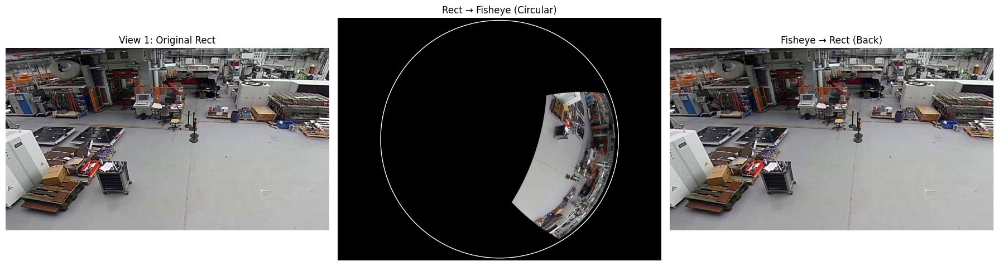

det(R): -1.0
Fv: [0.54133803 0.60121679 0.58778525]
Rv: [ 0.74314483 -0.66913061  0.        ]
Uv: [-0.3933051  -0.43680957  0.80901699]
det(R): -1.0
Fv: [0.54133803 0.60121679 0.58778525]
Rv: [ 0.74314483 -0.66913061  0.        ]
Uv: [-0.3933051  -0.43680957  0.80901699]

View 2:
  Photometric MSE (Fisheye): 0.144034
  Photometric Mean (Rect round-trip): 2.031px
  Geometric Error (Fisheye-domain): 0.068424
  Geometric Error (Rect-domain round-trip): 0.013905


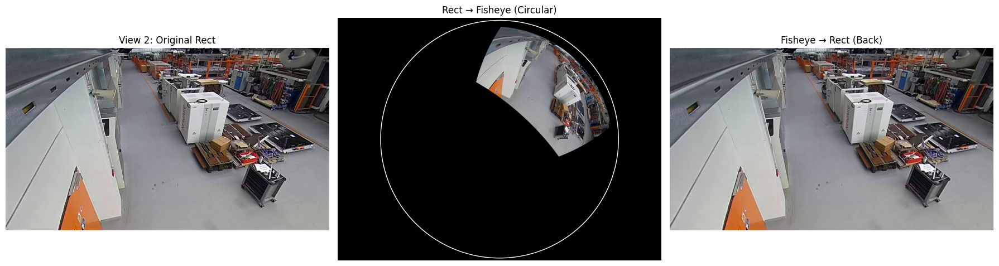

det(R): -1.0000000000000002
Fv: [-0.4065743   0.23473578  0.88294759]
Rv: [0.5       0.8660254 0.       ]
Uv: [ 0.76465505 -0.4414738   0.46947156]
det(R): -1.0000000000000002
Fv: [-0.4065743   0.23473578  0.88294759]
Rv: [0.5       0.8660254 0.       ]
Uv: [ 0.76465505 -0.4414738   0.46947156]

View 3:
  Photometric MSE (Fisheye): 0.141839
  Photometric Mean (Rect round-trip): 1.265px
  Geometric Error (Fisheye-domain): 0.088869
  Geometric Error (Rect-domain round-trip): 0.008724


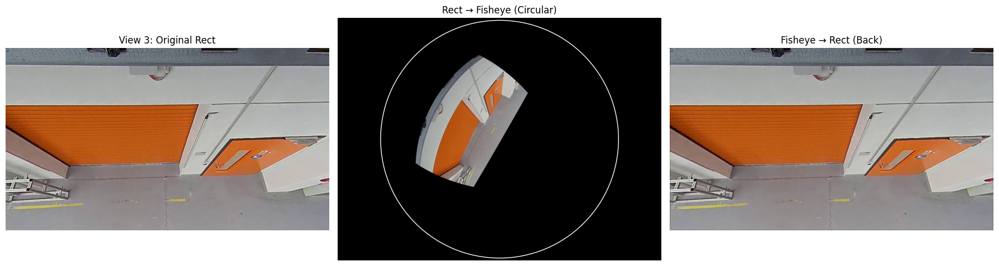

det(R): -1.0
Fv: [ 0.34493224 -0.77473049  0.52991926]
Rv: [-0.91354546 -0.40673664  0.        ]
Uv: [-0.21553758  0.48410534  0.8480481 ]
det(R): -1.0
Fv: [ 0.34493224 -0.77473049  0.52991926]
Rv: [-0.91354546 -0.40673664  0.        ]
Uv: [-0.21553758  0.48410534  0.8480481 ]

View 4:
  Photometric MSE (Fisheye): 0.133170
  Photometric Mean (Rect round-trip): 1.931px
  Geometric Error (Fisheye-domain): 0.098663
  Geometric Error (Rect-domain round-trip): 0.013188


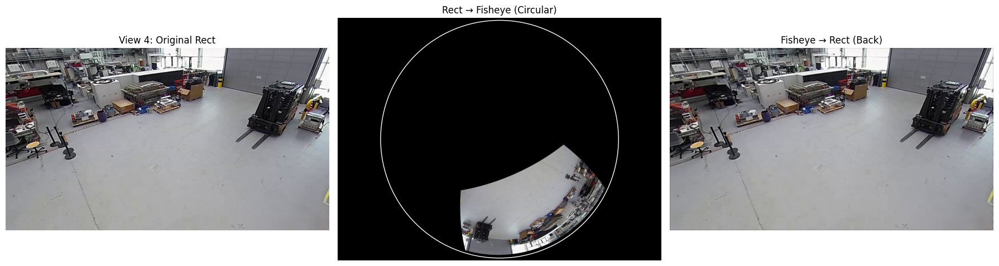

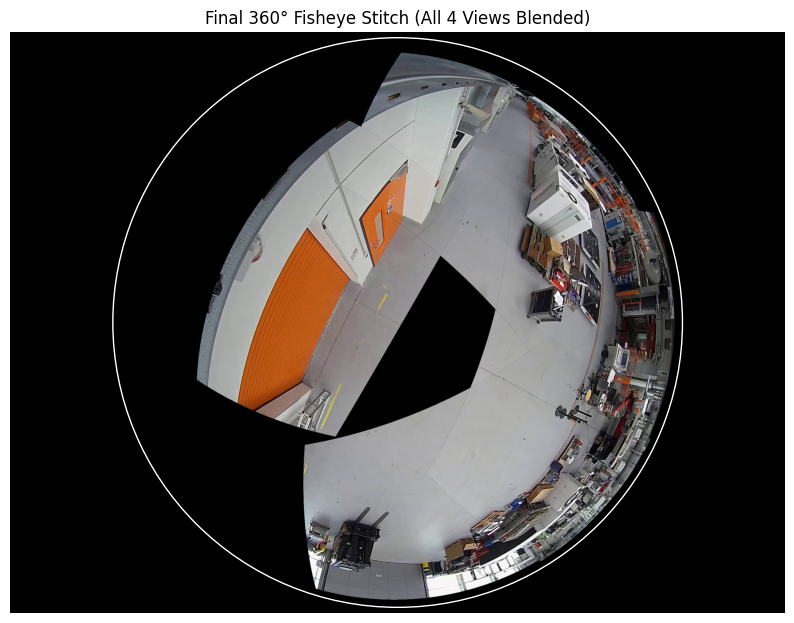

In [51]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# =====================================================
# FISHEYE PARAMETERS (geometry-accurate)
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# =====================================================
# CAMERA SETTINGS
# =====================================================
cam_settings = [
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": -18.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 54.0, "yaw": 48.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 28.0, "yaw": 150.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": 294.0},
]

# =====================================================
# LOAD IMAGES
# =====================================================
views = [
    cv2.imread("captures_yaw_pitch/capture1/view1_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view2_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view3_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view4_1.jpg"),
]
fisheye_img = cv2.imread("captures_yaw_pitch/capture1/fisheye_1.jpg")

if fisheye_img is None or any(v is None for v in views):
    raise FileNotFoundError("❌ Missing fisheye or rect images!")

fisheye_img = cv2.cvtColor(fisheye_img, cv2.COLOR_BGR2RGB) / 255.0
views = [cv2.cvtColor(v, cv2.COLOR_BGR2RGB) / 255.0 for v in views]



def compute_basis(yaw_deg, pitch_deg):
    """Compute Fv, Rv, Uv (columns of R) for OpenCV convention (0° yaw = right)."""
    # ✅ Shift yaw by -90° so 0° points right
    yaw_deg_corrected = yaw_deg - 90.0

    yaw, pitch = np.deg2rad([yaw_deg_corrected, pitch_deg])

    # Rotation around Z (negative yaw)
    Rz = np.array([
        [ np.cos(-yaw), -np.sin(-yaw), 0],
        [ np.sin(-yaw),  np.cos(-yaw), 0],
        [ 0,             0,            1]
    ])

    # Rotation around X (pitch)
    Rx = np.array([
        [ 1, 0,           0          ],
        [ 0, np.cos(pitch), -np.sin(pitch)],
        [ 0, np.sin(pitch),  np.cos(pitch)]
    ])

    # Combined rotation
    R_ = Rz @ Rx

    # Flip world Y (for OpenCV Y-down image space)
    R = np.diag([1, -1, 1]) @ R_

    print("det(R):", np.linalg.det(R))
    Rv = R[:, 0]  # Right
    Uv = R[:, 1]  # Up
    Fv = R[:, 2]  # Forward (optical axis)
    print("Fv:", Fv)
    print("Rv:", Rv)
    print("Uv:", Uv)
    return Fv, Rv, Uv


def project_rect_to_fisheye(rect_img, view, fish):
    """Warp rectilinear image to fisheye image space."""
    Hr, Wr = 720,1280
    Hf, Wf = fish["height"], fish["width"]
    cx_f, cy_f = fish["cx"], fish["cy"]
    radius, theta_max = fish["radius"], fish["theta_max_rad"]
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(view["fov"] / 2))
    Fv, Rv, Uv = compute_basis(view["yaw"], view["pitch"])

    # fisheye pixel grid
    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, cy_f - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    # fisheye rays (global coordinates)
    ray = np.dstack([sin_t * np.cos(phi),
                     sin_t * np.sin(phi),
                     np.cos(theta)])

    # rotate rays to rect camera coordinates
    R = np.stack([Rv, Uv, Fv], axis=1)
    ray_rect = ray @ R
    Xc, Yc, Zc = ray_rect[..., 0], ray_rect[..., 1], ray_rect[..., 2]

    # perspective projection
    u = f * (Xc / (Zc + 1e-6)) + cx_r
    v = f * (Yc / (Zc + 1e-6)) + cy_r
    valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)

    warped = cv2.remap(rect_img, u.astype(np.float32), v.astype(np.float32),
                       cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    mask = np.zeros((Hf, Wf), np.uint8); mask[valid] = 1
    return warped, mask


def fisheye_to_rect_inverse(fish_img, view, fish):
    """Unwarp fisheye image into rectilinear view."""
    Hr, Wr = 720, 1280
    Hf, Wf = fish["height"], fish["width"]
    cx_f, cy_f = fish["cx"], fish["cy"]
    radius, theta_max = fish["radius"], fish["theta_max_rad"]
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(view["fov"] / 2))
    Fv, Rv, Uv = compute_basis(view["yaw"], view["pitch"])

    # rectilinear pixel grid
    xs, ys = np.meshgrid(np.arange(Wr), np.arange(Hr))
    ray = np.stack([(xs - cx_r) / f, (ys - cy_r) / f, np.ones_like(xs)], axis=-1)
    ray /= np.linalg.norm(ray, axis=2, keepdims=True)

    # rotate to fisheye/global coordinates
    R = np.stack([Rv, Uv, Fv], axis=1)
    ray_fish = ray @ R.T
    Xf, Yf, Zf = ray_fish[..., 0], ray_fish[..., 1], ray_fish[..., 2]

    # project onto fisheye image
    theta = np.arccos(np.clip(Zf, -1, 1))
    phi = np.arctan2(Yf, Xf)
    r = (theta / theta_max) * radius
    u = cx_f + r * np.cos(phi)
    v = cy_f - r * np.sin(phi)
    valid = (u >= 0) & (u < Wf) & (v >= 0) & (v < Hf)

    rectified = cv2.remap(fish_img, u.astype(np.float32), v.astype(np.float32),
                          cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    mask = np.zeros((Hr, Wr), np.uint8); mask[valid] = 1
    return rectified, mask

# =====================================================
# MAIN ROUND TRIP + GEOMETRIC ERROR (Euclidean Form)
# =====================================================
Hf, Wf = fisheye_params["height"], fisheye_params["width"]
cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
radius = fisheye_params["radius"]


fisheye_canvas = np.zeros((Hf, Wf, 3), dtype=np.float32)
weight_mask = np.zeros((Hf, Wf, 1), dtype=np.float32)

for i, params in enumerate(cam_settings):
    rect_img = cv2.resize(views[i], (1280, 720))
    warped, mask = project_rect_to_fisheye(rect_img, params, fisheye_params)
    rect_back, mask_inv = fisheye_to_rect_inverse(warped, params, fisheye_params)

    # Mask fisheye circle
    yy, xx = np.mgrid[0:warped.shape[0], 0:warped.shape[1]]
    circle_mask = ((xx - cx_f)**2 + (yy - cy_f)**2) <= radius**2
    warped_circle = warped.copy()
    warped_circle[~circle_mask] = 0

    # -------------------------------------------------
    # ✅ Photometric Error
    # -------------------------------------------------
    diff_photo = np.abs(cv2.resize(fisheye_img, (Wf, Hf)) - warped_circle)
    mse_fish = np.mean(diff_photo**2)
    diff_rect = np.abs(rect_img - rect_back)
    mean_photo_rect = np.mean(diff_rect[mask_inv > 0]) * 255

    # -------------------------------------------------
    # ✅ Geometric Error (Fisheye-domain)
    # -------------------------------------------------
    yy_valid, xx_valid = np.where(mask > 0)
    real_fish = cv2.resize(fisheye_img, (Wf, Hf))
    geo_error_fish = np.sqrt(
        (warped_circle[yy_valid, xx_valid, 0] - real_fish[yy_valid, xx_valid, 0])**2 +
        (warped_circle[yy_valid, xx_valid, 1] - real_fish[yy_valid, xx_valid, 1])**2 +
        (warped_circle[yy_valid, xx_valid, 2] - real_fish[yy_valid, xx_valid, 2])**2
    )
    mean_geo_error_fish = np.mean(geo_error_fish)

    # -------------------------------------------------
    # ✅ Geometric Error (Rect-domain round-trip)
    # -------------------------------------------------
    ys_valid, xs_valid = np.where(mask_inv > 0)
    geo_error_rect = np.sqrt(
        (rect_img[ys_valid, xs_valid, 0] - rect_back[ys_valid, xs_valid, 0])**2 +
        (rect_img[ys_valid, xs_valid, 1] - rect_back[ys_valid, xs_valid, 1])**2 +
        (rect_img[ys_valid, xs_valid, 2] - rect_back[ys_valid, xs_valid, 2])**2
    )
    mean_geo_error_rect = np.mean(geo_error_rect)

    # -------------------------------------------------
    # ✅ Print Summary
    # -------------------------------------------------
    print(f"\nView {i+1}:")
    print(f"  Photometric MSE (Fisheye): {mse_fish:.6f}")
    print(f"  Photometric Mean (Rect round-trip): {mean_photo_rect:.3f}px")
    print(f"  Geometric Error (Fisheye-domain): {mean_geo_error_fish:.6f}")
    print(f"  Geometric Error (Rect-domain round-trip): {mean_geo_error_rect:.6f}")

    # -------------------------------------------------
    # Visualization
    # -------------------------------------------------
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1); plt.imshow(rect_img); plt.title(f"View {i+1}: Original Rect"); plt.axis("off")
    plt.subplot(1, 3, 2); plt.imshow(warped_circle)
    circ = plt.Circle((cx_f, cy_f), radius, color=(1,1,1), fill=False, linewidth=1)
    plt.gca().add_patch(circ); plt.title("Rect → Fisheye (Circular)"); plt.axis("off")
    plt.subplot(1, 3, 3); plt.imshow(rect_back); plt.title("Fisheye → Rect (Back)"); plt.axis("off")
    plt.tight_layout(); plt.show()
     # accumulate for stitched fisheye
    mask3 = mask[..., None].astype(np.float32)
    fisheye_canvas += warped * mask3
    weight_mask += mask3

# Final fisheye blend
weight_mask[weight_mask == 0] = 1
fisheye_stitched = fisheye_canvas / weight_mask
yy, xx = np.mgrid[0:Hf, 0:Wf]
circle_mask = ((xx - cx_f)**2 + (yy - cy_f)**2) <= radius**2
fisheye_stitched[~circle_mask] = 0

plt.figure(figsize=(10,10))
plt.imshow(fisheye_stitched)
circ = plt.Circle((fisheye_params["cx"], fisheye_params["cy"]),
                    fisheye_params["radius"], color=(1,1,1), fill=False, linewidth=1)
plt.gca().add_patch(circ)
plt.title("Final 360° Fisheye Stitch (All 4 Views Blended)")
plt.axis("off"); plt.show()


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# =====================================================
# FISHEYE PARAMETERS (geometry-accurate)
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# =====================================================
# CAMERA SETTINGS
# =====================================================
cam_settings = [
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": -18.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 54.0, "yaw": 48.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 28.0, "yaw": 150.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": 294.0},
]

# =====================================================
# LOAD IMAGES
# =====================================================
views = [
    cv2.imread("captures_yaw_pitch/capture1/view1_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view2_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view3_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view4_1.jpg"),
]
fisheye_img = cv2.imread("captures_yaw_pitch/capture1/fisheye_1.jpg")

if fisheye_img is None or any(v is None for v in views):
    raise FileNotFoundError("❌ Missing fisheye or rect images!")

fisheye_img = cv2.cvtColor(fisheye_img, cv2.COLOR_BGR2RGB) / 255.0
views = [cv2.cvtColor(v, cv2.COLOR_BGR2RGB) / 255.0 for v in views]



def compute_basis(yaw_deg, pitch_deg):
    """Compute Fv, Rv, Uv (columns of R) for OpenCV convention (0° yaw = right)."""
    # ✅ Shift yaw by -90° so 0° points right
    yaw_deg_corrected = yaw_deg - 90.0
    yaw, pitch = np.deg2rad([yaw_deg_corrected, pitch_deg])

    # Right-handed rotations (Z then X)
    Rz = np.array([
        [ np.cos(-yaw), -np.sin(-yaw), 0],
        [ np.sin(-yaw),  np.cos(-yaw), 0],
        [ 0, 0, 1]
    ])
    Rx = np.array([
        [1, 0, 0],
        [0, np.cos(pitch), -np.sin(pitch)],
        [0, np.sin(pitch),  np.cos(pitch)]
    ])

    # Combine yaw and pitch
    R = Rz @ Rx

    # Right-handed: det(R) = +1
    print("det(R):", np.linalg.det(R))

    Rv, Uv, Fv = R[:, 0], R[:, 1], R[:, 2]
    return Fv, Rv, Uv


def project_rect_to_fisheye(rect_img, view, fish):
    """Warp rectilinear image to fisheye image space."""
    Hr, Wr = 720,1280
    Hf, Wf = fish["height"], fish["width"]
    cx_f, cy_f = fish["cx"], fish["cy"]
    radius, theta_max = fish["radius"], fish["theta_max_rad"]
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(view["fov"] / 2))
    Fv, Rv, Uv = compute_basis(view["yaw"], view["pitch"])

    # fisheye pixel grid
    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, ys - cy_f 
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    # fisheye rays (global coordinates)
    ray = np.dstack([sin_t * np.cos(phi),
                     sin_t * np.sin(phi),
                     np.cos(theta)])

    # rotate rays to rect camera coordinates
    R = np.stack([Rv, Uv, Fv], axis=1)
    ray_rect = ray @ R
    Xc, Yc, Zc = ray_rect[..., 0], ray_rect[..., 1], ray_rect[..., 2]

    # perspective projection
    u = f * (Xc / (Zc + 1e-6)) + cx_r
    v = f * (Yc / (Zc + 1e-6)) + cy_r
    valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)

    warped = cv2.remap(rect_img, u.astype(np.float32), v.astype(np.float32),
                       cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    mask = np.zeros((Hf, Wf), np.uint8); mask[valid] = 1
    return warped, mask


def fisheye_to_rect_inverse(fish_img, view, fish):
    """Unwarp fisheye image into rectilinear view."""
    Hr, Wr = 720, 1280
    Hf, Wf = fish["height"], fish["width"]
    cx_f, cy_f = fish["cx"], fish["cy"]
    radius, theta_max = fish["radius"], fish["theta_max_rad"]
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(view["fov"] / 2))
    Fv, Rv, Uv = compute_basis(view["yaw"], view["pitch"])

    # rectilinear pixel grid
    xs, ys = np.meshgrid(np.arange(Wr), np.arange(Hr))
    ray = np.stack([(xs - cx_r) / f, (ys - cy_r) / f, np.ones_like(xs)], axis=-1)
    ray /= np.linalg.norm(ray, axis=2, keepdims=True)

    # rotate to fisheye/global coordinates
    R = np.stack([Rv, Uv, Fv], axis=1)
    ray_fish = ray @ R.T
    Xf, Yf, Zf = ray_fish[..., 0], ray_fish[..., 1], ray_fish[..., 2]

    # project onto fisheye image
    theta = np.arccos(np.clip(Zf, -1, 1))
    phi = np.arctan2(Yf, Xf)
    r = (theta / theta_max) * radius
    u = cx_f + r * np.cos(phi)
    v = cy_f + r * np.sin(phi)
    valid = (u >= 0) & (u < Wf) & (v >= 0) & (v < Hf)

    rectified = cv2.remap(fish_img, u.astype(np.float32), v.astype(np.float32),
                          cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    mask = np.zeros((Hr, Wr), np.uint8); mask[valid] = 1
    return rectified, mask

# =====================================================
# MAIN ROUND TRIP + GEOMETRIC ERROR (Euclidean Form)
# =====================================================
Hf, Wf = fisheye_params["height"], fisheye_params["width"]
cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
radius = fisheye_params["radius"]


fisheye_canvas = np.zeros((Hf, Wf, 3), dtype=np.float32)
weight_mask = np.zeros((Hf, Wf, 1), dtype=np.float32)

for i, params in enumerate(cam_settings):
    rect_img = cv2.resize(views[i], (1280, 720))
    warped, mask = project_rect_to_fisheye(rect_img, params, fisheye_params)
    rect_back, mask_inv = fisheye_to_rect_inverse(warped, params, fisheye_params)

    # Mask fisheye circle
    yy, xx = np.mgrid[0:warped.shape[0], 0:warped.shape[1]]
    circle_mask = ((xx - cx_f)**2 + (yy - cy_f)**2) <= radius**2
    warped_circle = warped.copy()
    warped_circle[~circle_mask] = 0

    # -------------------------------------------------
    # ✅ Photometric Error
    # -------------------------------------------------
    diff_photo = np.abs(cv2.resize(fisheye_img, (Wf, Hf)) - warped_circle)
    mse_fish = np.mean(diff_photo**2)
    diff_rect = np.abs(rect_img - rect_back)
    mean_photo_rect = np.mean(diff_rect[mask_inv > 0]) * 255

    # -------------------------------------------------
    # ✅ Geometric Error (Fisheye-domain)
    # -------------------------------------------------
    yy_valid, xx_valid = np.where(mask > 0)
    real_fish = cv2.resize(fisheye_img, (Wf, Hf))
    geo_error_fish = np.sqrt(
        (warped_circle[yy_valid, xx_valid, 0] - real_fish[yy_valid, xx_valid, 0])**2 +
        (warped_circle[yy_valid, xx_valid, 1] - real_fish[yy_valid, xx_valid, 1])**2 +
        (warped_circle[yy_valid, xx_valid, 2] - real_fish[yy_valid, xx_valid, 2])**2
    )
    mean_geo_error_fish = np.mean(geo_error_fish)

    # -------------------------------------------------
    # ✅ Geometric Error (Rect-domain round-trip)
    # -------------------------------------------------
    ys_valid, xs_valid = np.where(mask_inv > 0)
    geo_error_rect = np.sqrt(
        (rect_img[ys_valid, xs_valid, 0] - rect_back[ys_valid, xs_valid, 0])**2 +
        (rect_img[ys_valid, xs_valid, 1] - rect_back[ys_valid, xs_valid, 1])**2 +
        (rect_img[ys_valid, xs_valid, 2] - rect_back[ys_valid, xs_valid, 2])**2
    )
    mean_geo_error_rect = np.mean(geo_error_rect)

    # -------------------------------------------------
    # ✅ Print Summary
    # -------------------------------------------------
    print(f"\nView {i+1}:")
    print(f"  Photometric MSE (Fisheye): {mse_fish:.6f}")
    print(f"  Photometric Mean (Rect round-trip): {mean_photo_rect:.3f}px")
    print(f"  Geometric Error (Fisheye-domain): {mean_geo_error_fish:.6f}")
    print(f"  Geometric Error (Rect-domain round-trip): {mean_geo_error_rect:.6f}")

    # -------------------------------------------------
    # Visualization
    # -------------------------------------------------
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1); plt.imshow(rect_img); plt.title(f"View {i+1}: Original Rect"); plt.axis("off")
    plt.subplot(1, 3, 2); plt.imshow(warped_circle)
    circ = plt.Circle((cx_f, cy_f), radius, color=(1,1,1), fill=False, linewidth=1)
    plt.gca().add_patch(circ); plt.title("Rect → Fisheye (Circular)"); plt.axis("off")
    plt.subplot(1, 3, 3); plt.imshow(rect_back); plt.title("Fisheye → Rect (Back)"); plt.axis("off")
    plt.tight_layout(); plt.show()
     # accumulate for stitched fisheye
    mask3 = mask[..., None].astype(np.float32)
    fisheye_canvas += warped * mask3
    weight_mask += mask3

# Final fisheye blend
weight_mask[weight_mask == 0] = 1
fisheye_stitched = fisheye_canvas / weight_mask
yy, xx = np.mgrid[0:Hf, 0:Wf]
circle_mask = ((xx - cx_f)**2 + (yy - cy_f)**2) <= radius**2
fisheye_stitched[~circle_mask] = 0

plt.figure(figsize=(10,10))
plt.imshow(fisheye_stitched)
circ = plt.Circle((fisheye_params["cx"], fisheye_params["cy"]),
                    fisheye_params["radius"], color=(1,1,1), fill=False, linewidth=1)
plt.gca().add_patch(circ)
plt.title("Final 360° Fisheye Stitch (All 4 Views Blended)")
plt.axis("off"); plt.show()


In [ ]:
#################working##################Perfect
import numpy as np
import cv2

# ----------------------------
# FISHEYE PARAMETERS
# ----------------------------
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# ----------------------------
# CAMERA SETTINGS
# ----------------------------
cam_settings = [
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": -18.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 54.0, "yaw": 48.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 28.0, "yaw": 150.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": 294.0},
]

# ----------------------------
# LOAD IMAGES
# ----------------------------
views = [
    cv2.imread("captures_yaw_pitch/capture1/view1_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view2_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view3_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view4_1.jpg"),
]
fisheye_img = cv2.imread("captures_yaw_pitch/capture1/fisheye_1.jpg")

if fisheye_img is None or any(v is None for v in views):
    raise FileNotFoundError("❌ Missing fisheye or rect views!")

# ----------------------------
# DISPLAY SIZES
# ----------------------------
FISH_W_DISP, FISH_H_DISP = 1280, 720
RECT_TILE_W_DISP, RECT_TILE_H_DISP = 640, 360

fisheye_display = cv2.resize(fisheye_img, (FISH_W_DISP, FISH_H_DISP))
views_disp = [cv2.resize(v, (RECT_TILE_W_DISP, RECT_TILE_H_DISP)) for v in views]

scale_fx = fisheye_params["width"] / FISH_W_DISP
scale_fy = fisheye_params["height"] / FISH_H_DISP

# ----------------------------
# BUILD RECT GRID
# ----------------------------
def make_rect_grid_disp():
    grid = np.ones((RECT_TILE_H_DISP * 2, RECT_TILE_W_DISP * 2, 3), dtype=np.uint8) * 30
    grid[0:RECT_TILE_H_DISP, 0:RECT_TILE_W_DISP] = views_disp[0]
    grid[0:RECT_TILE_H_DISP, RECT_TILE_W_DISP:] = views_disp[1]
    grid[RECT_TILE_H_DISP:, 0:RECT_TILE_W_DISP] = views_disp[2]
    grid[RECT_TILE_H_DISP:, RECT_TILE_W_DISP:] = views_disp[3]
    return grid

rect_grid_disp = make_rect_grid_disp()

# ----------------------------
# CAMERA BASIS
# ----------------------------
def compute_basis(yaw_deg, pitch_deg):
    """Compute Fv, Rv, Uv (columns of R) for OpenCV convention (0° yaw = right)."""
    # ✅ Shift yaw by -90° so 0° points right
    yaw_deg_corrected = yaw_deg - 90.0

    yaw, pitch = np.deg2rad([yaw_deg_corrected, pitch_deg])

    # Rotation around Z (negative yaw)
    Rz = np.array([
        [ np.cos(-yaw), -np.sin(-yaw), 0],
        [ np.sin(-yaw),  np.cos(-yaw), 0],
        [ 0,             0,            1]
    ])

    # Rotation around X (pitch)
    Rx = np.array([
        [ 1, 0,           0          ],
        [ 0, np.cos(pitch), -np.sin(pitch)],
        [ 0, np.sin(pitch),  np.cos(pitch)]
    ])

    # Combined rotation
    R_ = Rz @ Rx

    # Flip world Y (for OpenCV Y-down image space)
    R = np.diag([1, -1, 1]) @ R_
    Rv = R[:, 0]  # Right
    Uv = R[:, 1]  # Up
    Fv = R[:, 2]  # Forward (optical axis)
    print("Fv:", Fv)
    print("Rv:", Rv)
    print("Uv:", Uv)
    return Fv, Rv, Uv

# ----------------------------
# RECT → FISHEYE
# ----------------------------
def rect_to_fisheye_point(u, v, view_params, fisheye_params):
    Hr, Wr = 720, 1280
    cx_r, cy_r = Wr / 2, Hr / 2
    fov = view_params["fov"]
    f = (Wr / 2) / np.tan(np.deg2rad(fov / 2))

    x = (u - cx_r) / f
    y = (v - cy_r) / f
    z = 1
    ray_rect = np.array([x, y, z])
    ray_rect /= np.linalg.norm(ray_rect)

    Fv, Rv, Uv = compute_basis(view_params["yaw"], view_params["pitch"])
    ray_fish = Rv * ray_rect[0] + Uv * ray_rect[1] + Fv * ray_rect[2]
    Rmat = np.stack([Rv, Uv, Fv], axis=1)
    ray_fish = Rmat @ ray_rect
    Xf, Yf, Zf = ray_fish
    theta = np.arccos(np.clip(Zf, -1, 1))
    phi = np.arctan2(Yf, Xf)
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    r = (theta / theta_max) * radius
    u_f = cx_f + r * np.cos(phi)
    v_f = cy_f - r * np.sin(phi)
    return u_f, v_f

# ----------------------------
# FISHEYE → RECT
# ----------------------------
def fisheye_to_rect_point(u_f, v_f, view_params, fisheye_params):
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    dx, dy = u_f - cx_f, cy_f - v_f
    r = np.sqrt(dx ** 2 + dy ** 2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    ray_fish = np.array([sin_t * np.cos(phi), 
                         sin_t * np.sin(phi), 
                         np.cos(theta)])

    Fv, Rv, Uv = compute_basis(view_params["yaw"], view_params["pitch"])
    Rmat = np.stack([Rv, Uv, Fv], axis=1)
    ray_rect = Rmat.T @ ray_fish

    Xc, Yc, Zc = ray_rect
    if Zc <= 0:
        return None

    Hr, Wr = 720, 1280
    fov = view_params["fov"]
    f = (Wr / 2) / np.tan(np.deg2rad(fov / 2))
    cx_r, cy_r = Wr / 2, Hr / 2
    u = f * (Xc / Zc) + cx_r
    v = f * (Yc / Zc) + cy_r
    if 0 <= u < Wr and 0 <= v < Hr:
        return int(u), int(v)
    return None

# ----------------------------
# DRAW TEXT
# ----------------------------
def draw_text(img, text, pos, color=(255, 255, 255)):
    """
    Draw readable text (bold serif font with shadow background)
    on image at given pixel position.
    """
    font = cv2.FONT_HERSHEY_COMPLEX  # serif style (similar to Times New Roman)
    scale = 0.8                    # font size
    thickness = 2            # bold
    x, y = int(pos[0]), int(pos[1])

    # Draw black shadow for readability
    cv2.putText(img, text, (x + 1, y + 1), font, scale, (0, 0, 0), thickness , cv2.LINE_AA)
    # Draw main text
    cv2.putText(img, text, (x, y), font, scale, color, thickness, cv2.LINE_AA)

# ----------------------------
# MOUSE CALLBACK
# ----------------------------
def on_mouse(event, x, y, flags, param):
    global canvas
    if event != cv2.EVENT_LBUTTONDOWN:
        return

    fisheye_disp = fisheye_display.copy()
    rect_disp = rect_grid_disp.copy()

    if x < FISH_W_DISP:  # Clicked in fisheye
        u_full, v_full = x * scale_fx, y * scale_fy
        cv2.circle(fisheye_disp, (x, y), 3, (0, 255, 0), -1)
        draw_text(fisheye_disp, f"({u_full:.1f},{v_full:.1f})", (x, y), (0, 255, 0))
        print(f"🟢 FISHEYE click -> display=({x},{y}) full=({u_full:.1f},{v_full:.1f})")

        for i, cam in enumerate(cam_settings):
            pt = fisheye_to_rect_point(u_full, v_full, cam, fisheye_params)
            if pt is not None:
                u_rect, v_rect = pt
                ox = (i % 2) * RECT_TILE_W_DISP
                oy = (i // 2) * RECT_TILE_H_DISP
                u_disp, v_disp = int(u_rect / 2), int(v_rect / 2)
                pos = (ox + u_disp, oy + v_disp)
                cv2.circle(rect_disp, pos, 3, (0, 0, 255), -1)
                draw_text(rect_disp, f"({u_rect},{v_rect})", pos, (0, 0, 255))
                print(f"   ↳ Rect view {i}: rect_full=({u_rect},{v_rect})  rect_disp=({pos[0]},{pos[1]})")

    else:  # Clicked in rect grid
        xr = x - FISH_W_DISP
        xi = xr % RECT_TILE_W_DISP
        yi = y % RECT_TILE_H_DISP
        view_idx = (y >= RECT_TILE_H_DISP) * 2 + (xr >= RECT_TILE_W_DISP)
        u_full, v_full = xi * 2, yi * 2
        u_f, v_f = rect_to_fisheye_point(u_full, v_full, cam_settings[view_idx], fisheye_params)
        u_fd, v_fd = int(u_f / scale_fx), int(v_f / scale_fy)
        cv2.circle(fisheye_disp, (u_fd, v_fd), 3, (0, 0, 255), -1)
        cv2.circle(rect_disp, (x - FISH_W_DISP, y), 3, (0, 255, 0), -1)
        draw_text(rect_disp, f"({u_full},{v_full})", (x - FISH_W_DISP, y), (0, 255, 0))
        draw_text(fisheye_disp, f"({int(u_f)},{int(v_f)})", (u_fd, v_fd), (0, 0, 255))
        print(f"🟢 RECT click -> view={view_idx} rect_full=({u_full},{v_full}) → fisheye_full=({int(u_f)},{int(v_f)}) disp=({u_fd},{v_fd})")

    # combine fisheye + rect grid into unified white canvas
    canvas = np.ones((max(FISH_H_DISP, rect_disp.shape[0]), FISH_W_DISP + rect_disp.shape[1], 3), dtype=np.uint8) * 255
    canvas[0:FISH_H_DISP, 0:FISH_W_DISP] = fisheye_disp
    canvas[0:rect_disp.shape[0], FISH_W_DISP:] = rect_disp

    cv2.imshow("Unified Mapping", canvas)

# ----------------------------
# DISPLAY
# ----------------------------
canvas = np.ones((720, 2560, 3), dtype=np.uint8) * 255
canvas[0:720, 0:1280] = fisheye_display
canvas[0:720, 1280:] = rect_grid_disp

cv2.namedWindow("Unified Mapping", cv2.WINDOW_NORMAL)
cv2.setMouseCallback("Unified Mapping", on_mouse)
cv2.imshow("Unified Mapping", canvas)
print("🟢 Click anywhere (fisheye left, rect right). Press ESC to exit.")

while True:
    if cv2.waitKey(20) & 0xFF == 27:
        break

cv2.destroyAllWindows()


🟢 Click anywhere (fisheye left, rect right). Press ESC to exit.
🟢 FISHEYE click -> display=(856,354) full=(1733.4,955.8)
det(R): -1.0
Fv: [ 0.80654167 -0.26206127  0.52991926]
Rv: [-0.30901699 -0.95105652  0.        ]
Uv: [-0.50398317  0.16375406  0.8480481 ]
   ↳ Rect view 0: rect_full=(482,573)  rect_disp=(241,286)
det(R): -1.0
Fv: [0.54133803 0.60121679 0.58778525]
Rv: [ 0.74314483 -0.66913061  0.        ]
Uv: [-0.3933051  -0.43680957  0.80901699]
   ↳ Rect view 1: rect_full=(1013,625)  rect_disp=(1146,312)
det(R): -1.0000000000000002
Fv: [-0.4065743   0.23473578  0.88294759]
Rv: [0.5       0.8660254 0.       ]
Uv: [ 0.76465505 -0.4414738   0.46947156]
det(R): -1.0
Fv: [ 0.34493224 -0.77473049  0.52991926]
Rv: [-0.91354546 -0.40673664  0.        ]
Uv: [-0.21553758  0.48410534  0.8480481 ]
🟢 FISHEYE click -> display=(720,345) full=(1458.0,931.5)
det(R): -1.0
Fv: [ 0.80654167 -0.26206127  0.52991926]
Rv: [-0.30901699 -0.95105652  0.        ]
Uv: [-0.50398317  0.16375406  0.8480481 ]
d

In [53]:
#################working##################Perfect
import numpy as np
import cv2

# ----------------------------
# FISHEYE PARAMETERS
# ----------------------------
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# ----------------------------
# CAMERA SETTINGS
# ----------------------------
cam_settings = [
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": -18.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 54.0, "yaw": 48.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 28.0, "yaw": 150.0},
    {"cx": 1296.0, "cy": 972.0, "fov": 90.0, "pitch": 58.0, "yaw": 294.0},
]

# ----------------------------
# LOAD IMAGES
# ----------------------------
views = [
    cv2.imread("captures_yaw_pitch/capture1/view1_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view2_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view3_1.jpg"),
    cv2.imread("captures_yaw_pitch/capture1/view4_1.jpg"),
]
fisheye_img = cv2.imread("captures_yaw_pitch/capture1/fisheye_1.jpg")

if fisheye_img is None or any(v is None for v in views):
    raise FileNotFoundError("❌ Missing fisheye or rect views!")

# ----------------------------
# DISPLAY SIZES
# ----------------------------
FISH_W_DISP, FISH_H_DISP = 1280, 720
RECT_TILE_W_DISP, RECT_TILE_H_DISP = 640, 360

fisheye_display = cv2.resize(fisheye_img, (FISH_W_DISP, FISH_H_DISP))
views_disp = [cv2.resize(v, (RECT_TILE_W_DISP, RECT_TILE_H_DISP)) for v in views]

scale_fx = fisheye_params["width"] / FISH_W_DISP
scale_fy = fisheye_params["height"] / FISH_H_DISP

# ----------------------------
# BUILD RECT GRID
# ----------------------------
def make_rect_grid_disp():
    grid = np.ones((RECT_TILE_H_DISP * 2, RECT_TILE_W_DISP * 2, 3), dtype=np.uint8) * 30
    grid[0:RECT_TILE_H_DISP, 0:RECT_TILE_W_DISP] = views_disp[0]
    grid[0:RECT_TILE_H_DISP, RECT_TILE_W_DISP:] = views_disp[1]
    grid[RECT_TILE_H_DISP:, 0:RECT_TILE_W_DISP] = views_disp[2]
    grid[RECT_TILE_H_DISP:, RECT_TILE_W_DISP:] = views_disp[3]
    return grid

rect_grid_disp = make_rect_grid_disp()

# ----------------------------
# CAMERA BASIS
# ----------------------------
def compute_basis(yaw_deg, pitch_deg):
    yaw = np.deg2rad(yaw_deg)
    pitch = np.deg2rad(pitch_deg)
    D = np.array([0, 0, 1])
    H = np.array([np.cos(yaw), np.sin(yaw), 0])
    Fv = np.cos(pitch) * D + np.sin(pitch) * H
    Fv /= np.linalg.norm(Fv)
    Rv = np.cross(Fv, D)
    Rv /= np.linalg.norm(Rv)
    Uv = np.cross(Rv, Fv)
    return Fv, Rv, Uv

# ----------------------------
# RECT → FISHEYE
# ----------------------------
def rect_to_fisheye_point(u, v, view_params, fisheye_params):
    Hr, Wr = 720, 1280
    cx_r, cy_r = Wr / 2, Hr / 2
    fov = view_params["fov"]
    f = (Wr / 2) / np.tan(np.deg2rad(fov / 2))

    x = (u - cx_r) / f
    y = (v - cy_r) / f
    z = 1
    ray_rect = np.array([x, y, z])
    ray_rect /= np.linalg.norm(ray_rect)

    Fv, Rv, Uv = compute_basis(view_params["yaw"], view_params["pitch"])
    Rmat = np.stack([Rv, Uv, Fv], axis=1)
    ray_fish = Rmat @ray_rect
    Xf, Yf, Zf = ray_fish
    theta = np.arccos(np.clip(Zf, -1, 1))
    phi = np.arctan2(Yf, Xf)
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    r = (theta / theta_max) * radius
    u_f = cx_f + r * np.cos(phi)
    v_f = cy_f - r * np.sin(phi)
    return u_f, v_f

# ----------------------------
# FISHEYE → RECT
# ----------------------------
def fisheye_to_rect_point(u_f, v_f, view_params, fisheye_params):
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    dx, dy = u_f - cx_f, cy_f - v_f
    r = np.sqrt(dx ** 2 + dy ** 2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    ray_fish = np.array([sin_t * np.cos(phi), 
                         sin_t * np.sin(phi), 
                         np.cos(theta)])

    Fv, Rv, Uv = compute_basis(view_params["yaw"], view_params["pitch"])
    Rmat = np.stack([Rv, Uv, Fv], axis=1)
    ray_rect = Rmat.T @ ray_fish

    Xc, Yc, Zc = ray_rect
    if Zc <= 0:
        return None

    Hr, Wr = 720, 1280
    fov = view_params["fov"]
    f = (Wr / 2) / np.tan(np.deg2rad(fov / 2))
    cx_r, cy_r = Wr / 2, Hr / 2
    u = f * (Xc / Zc) + cx_r
    v = f * (Yc / Zc) + cy_r
    if 0 <= u < Wr and 0 <= v < Hr:
        return int(u), int(v)
    return None

# ----------------------------
# DRAW TEXT
# ----------------------------
def draw_text(img, text, pos, color=(255, 255, 255)):
    """
    Draw readable text (bold serif font with shadow background)
    on image at given pixel position.
    """
    font = cv2.FONT_HERSHEY_COMPLEX  # serif style (similar to Times New Roman)
    scale = 0.8                    # font size
    thickness = 2            # bold
    x, y = int(pos[0]), int(pos[1])

    # Draw black shadow for readability
    cv2.putText(img, text, (x + 1, y + 1), font, scale, (0, 0, 0), thickness , cv2.LINE_AA)
    # Draw main text
    cv2.putText(img, text, (x, y), font, scale, color, thickness, cv2.LINE_AA)

# ----------------------------
# MOUSE CALLBACK
# ----------------------------
def on_mouse(event, x, y, flags, param):
    global canvas
    if event != cv2.EVENT_LBUTTONDOWN:
        return

    fisheye_disp = fisheye_display.copy()
    rect_disp = rect_grid_disp.copy()

    if x < FISH_W_DISP:  # Clicked in fisheye
        u_full, v_full = x * scale_fx, y * scale_fy
        cv2.circle(fisheye_disp, (x, y), 3, (0, 255, 0), -1)
        draw_text(fisheye_disp, f"({u_full:.1f},{v_full:.1f})", (x, y), (0, 255, 0))
        print(f"🟢 FISHEYE click -> display=({x},{y}) full=({u_full:.1f},{v_full:.1f})")

        for i, cam in enumerate(cam_settings):
            pt = fisheye_to_rect_point(u_full, v_full, cam, fisheye_params)
            if pt is not None:
                u_rect, v_rect = pt
                ox = (i % 2) * RECT_TILE_W_DISP
                oy = (i // 2) * RECT_TILE_H_DISP
                u_disp, v_disp = int(u_rect / 2), int(v_rect / 2)
                pos = (ox + u_disp, oy + v_disp)
                cv2.circle(rect_disp, pos, 3, (0, 0, 255), -1)
                draw_text(rect_disp, f"({u_rect},{v_rect})", pos, (0, 0, 255))
                print(f"   ↳ Rect view {i}: rect_full=({u_rect},{v_rect})  rect_disp=({pos[0]},{pos[1]})")

    else:  # Clicked in rect grid
        xr = x - FISH_W_DISP
        xi = xr % RECT_TILE_W_DISP
        yi = y % RECT_TILE_H_DISP
        view_idx = (y >= RECT_TILE_H_DISP) * 2 + (xr >= RECT_TILE_W_DISP)
        u_full, v_full = xi * 2, yi * 2
        u_f, v_f = rect_to_fisheye_point(u_full, v_full, cam_settings[view_idx], fisheye_params)
        u_fd, v_fd = int(u_f / scale_fx), int(v_f / scale_fy)
        cv2.circle(fisheye_disp, (u_fd, v_fd), 3, (0, 0, 255), -1)
        cv2.circle(rect_disp, (x - FISH_W_DISP, y), 3, (0, 255, 0), -1)
        draw_text(rect_disp, f"({u_full},{v_full})", (x - FISH_W_DISP, y), (0, 255, 0))
        draw_text(fisheye_disp, f"({int(u_f)},{int(v_f)})", (u_fd, v_fd), (0, 0, 255))
        print(f"🟢 RECT click -> view={view_idx} rect_full=({u_full},{v_full}) → fisheye_full=({int(u_f)},{int(v_f)}) disp=({u_fd},{v_fd})")

    # combine fisheye + rect grid into unified white canvas
    canvas = np.ones((max(FISH_H_DISP, rect_disp.shape[0]), FISH_W_DISP + rect_disp.shape[1], 3), dtype=np.uint8) * 255
    canvas[0:FISH_H_DISP, 0:FISH_W_DISP] = fisheye_disp
    canvas[0:rect_disp.shape[0], FISH_W_DISP:] = rect_disp

    cv2.imshow("Unified Mapping", canvas)

# ----------------------------
# DISPLAY
# ----------------------------
canvas = np.ones((720, 2560, 3), dtype=np.uint8) * 255
canvas[0:720, 0:1280] = fisheye_display
canvas[0:720, 1280:] = rect_grid_disp

cv2.namedWindow("Unified Mapping", cv2.WINDOW_NORMAL)
cv2.setMouseCallback("Unified Mapping", on_mouse)
cv2.imshow("Unified Mapping", canvas)
print("🟢 Click anywhere (fisheye left, rect right). Press ESC to exit.")

while True:
    if cv2.waitKey(20) & 0xFF == 27:
        break

cv2.destroyAllWindows()


🟢 Click anywhere (fisheye left, rect right). Press ESC to exit.
🟢 RECT click -> view=2 rect_full=(628,510) → fisheye_full=(1154,903) disp=(570,334)
🟢 RECT click -> view=2 rect_full=(644,516) → fisheye_full=(1166,893) disp=(576,330)
🟢 RECT click -> view=2 rect_full=(628,516) → fisheye_full=(1159,905) disp=(572,335)
🟢 RECT click -> view=2 rect_full=(628,508) → fisheye_full=(1153,902) disp=(569,334)
🟢 RECT click -> view=2 rect_full=(640,504) → fisheye_full=(1155,890) disp=(570,329)
🟢 RECT click -> view=2 rect_full=(624,510) → fisheye_full=(1152,906) disp=(569,335)
🟢 RECT click -> view=2 rect_full=(624,508) → fisheye_full=(1151,905) disp=(568,335)
🟢 RECT click -> view=2 rect_full=(628,510) → fisheye_full=(1154,903) disp=(570,334)
🟢 RECT click -> view=2 rect_full=(628,518) → fisheye_full=(1160,906) disp=(573,335)
🟢 RECT click -> view=2 rect_full=(628,518) → fisheye_full=(1160,906) disp=(573,335)
🟢 RECT click -> view=1 rect_full=(732,230) → fisheye_full=(1835,532) disp=(906,197)
🟢 RECT click